# Questions:
- What are the predicting variables actually affecting the life expectancy?
- How does Infant and Adult mortality rates affect life expectancy?
- Does Life Expectancy has positive or negative correlation with eating habits, lifestyle, exercise, smoking, drinking alcohol etc.
- What is the impact of schooling on the lifespan of humans?
- Does Life Expectancy have positive or negative relationship with drinking alcohol?
- Do densely populated countries tend to have lower life expectancy?
- What is the impact of Immunization coverage on life Expectancy?

# **Imports and Dataset Load**

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [4]:
df = pd.read_csv("C:\\Users\\Lion\\Desktop\\Life Expectancy Data.csv")

In [5]:
df.head()

,Country,Year,Status,Life expectancy,Adult Mortality,infant deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,...,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,thinness 1-19 years,thinness 5-9 years,Income composition of resources,Schooling
0,Afghanistan,2015,Developing,65.0,263.0,62,0.01,71.279624,65.0,1154,...,6.0,8.16,65.0,0.1,584.259210,33736494.0,17.2,17.3,0.479,10.1
1,Afghanistan,2014,Developing,59.9,271.0,64,0.01,73.523582,62.0,492,...,58.0,8.18,62.0,0.1,612.696514,327582.0,17.5,17.5,0.476,10.0
2,Afghanistan,2013,Developing,59.9,268.0,66,0.01,73.219243,64.0,430,...,62.0,8.13,64.0,0.1,631.744976,31731688.0,17.7,17.7,0.470,9.9
3,Afghanistan,2012,Developing,59.5,272.0,69,0.01,78.184215,67.0,2787,...,67.0,8.52,67.0,0.1,669.959000,3696958.0,17.9,18.0,0.463,9.8
4,Afghanistan,2011,Developing,59.2,275.0,71,0.01,7.097109,68.0,3013,...,68.0,7.87,68.0,0.1,63.537231,2978599.0,18.2,18.2,0.454,9.5


In [6]:
df.shape

(2938, 22)

In [7]:
df.columns

Index(['Country', 'Year', 'Status', 'Life expectancy ', 'Adult Mortality',
       'infant deaths', 'Alcohol', 'percentage expenditure', 'Hepatitis B',
       'Measles ', ' BMI ', 'under-five deaths ', 'Polio', 'Total expenditure',
       'Diphtheria ', ' HIV/AIDS', 'GDP', 'Population',
       ' thinness  1-19 years', ' thinness 5-9 years',
       'Income composition of resources', 'Schooling'],
      dtype='object')

In [8]:
df.rename(columns={'Life expectancy ':'Life expectancy'," BMI ":"BMI"," HIV/AIDS":"HIV/AIDS"," thinness  1-19 years":"Thinness  1-19 years"," thinness 5-9 years":"Thinness 5-9 years","infant deaths":"Infant Deaths","Life expectancy":"Life Expectancy","under-five deaths ":"Under-five deaths","Diphtheria ":"Diphtheria" }, inplace=True)

In order to understand the data we need to know the meaning of each column.

Country - Country name

Year - Year

Status - Status of the given country (Either Developing or Developed)

Life expectancy - in years

Adult Mortality - Adult Mortality Rates of both sexes (probability of dying between 15 and 60 years per 1000 population)

Infant deaths - Number of Infant Deaths per 1000 population

Alcohol - Alcohol, recorded per capita (15+) consumption (in litres of pure alcohol)

Percentage expenditure - Expenditure on health as a percentage of Gross Domestic Product per capita(%)

Hepatitis B - Hepatitis B (HepB) immunization coverage among 1-year-olds (%)

Measles - Measles - number of reported cases per 1000 population

BMI - Average Body Mass Index of entire population

Under five death - Number of under-five deaths per 1000 population

Polio - Polio (Pol3) immunization coverage among 1-year-olds (%)

Total expenditure - General government expenditure on health as a percentage of total government expenditure (%)

Diphtheria - Diphtheria tetanus toxoid and pertussis (DTP3) immunization coverage among 1-year-olds (%)

HIV/AID - Deaths per 1 000 live births HIV/AIDS (0-4 years)

GDP - Gross Domestic Product per capita (in USD)

Population - Population of the country

thinness 1-19 years - Prevalence of thinness among children and adolescents for Age 10 to 19 (% )

thinness 5-9 years - Prevalence of thinness among children for Age 5 to 9(%)

Income composition of resources - Human Development Index in terms of income composition of resources (index ranging from 0 to 1)

Schooling - Number of years of Schooling(years)

In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Country                          2938 non-null   object 
 1   Year                             2938 non-null   int64  
 2   Status                           2938 non-null   object 
 3   Life expectancy                  2928 non-null   float64
 4   Adult Mortality                  2928 non-null   float64
 5   Infant Deaths                    2938 non-null   int64  
 6   Alcohol                          2744 non-null   float64
 7   percentage expenditure           2938 non-null   float64
 8   Hepatitis B                      2385 non-null   float64
 9   Measles                          2938 non-null   int64  
 10  BMI                              2904 non-null   float64
 11  Under-five deaths                2938 non-null   int64  
 12  Polio               

In [10]:
df["Country"]= df["Country"].astype("category")
df["Status"]= df["Status"].astype("category")

In [11]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2938 entries, 0 to 2937
Data columns (total 22 columns):
 #   Column                           Non-Null Count  Dtype   
---  ------                           --------------  -----   
 0   Country                          2938 non-null   category
 1   Year                             2938 non-null   int64   
 2   Status                           2938 non-null   category
 3   Life expectancy                  2928 non-null   float64 
 4   Adult Mortality                  2928 non-null   float64 
 5   Infant Deaths                    2938 non-null   int64   
 6   Alcohol                          2744 non-null   float64 
 7   percentage expenditure           2938 non-null   float64 
 8   Hepatitis B                      2385 non-null   float64 
 9   Measles                          2938 non-null   int64   
 10  BMI                              2904 non-null   float64 
 11  Under-five deaths                2938 non-null   int64   
 12  Polio 

# **Missing Values**
- Detection of missing values
- Dealing with missing values 

### *Missing Values Detection*

In [12]:
df.describe().iloc[:, 1:]

,Life expectancy,Adult Mortality,Infant Deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,Under-five deaths,Polio,Total expenditure,Diphtheria,HIV/AIDS,GDP,Population,Thinness 1-19 years,Thinness 5-9 years,Income composition of resources,Schooling
count,2928.000000,2928.000000,2938.000000,2744.000000,2938.000000,2385.000000,2938.000000,2904.000000,2938.000000,2919.000000,2712.00000,2919.000000,2938.000000,2490.000000,2.286000e+03,2904.000000,2904.000000,2771.000000,2775.000000
mean,69.224932,164.796448,30.303948,4.602861,738.251295,80.940461,2419.592240,38.321247,42.035739,82.550188,5.93819,82.324084,1.742103,7483.158469,1.275338e+07,4.839704,4.870317,0.627551,11.992793
std,9.523867,124.292079,117.926501,4.052413,1987.914858,25.070016,11467.272489,20.044034,160.445548,23.428046,2.49832,23.716912,5.077785,14270.169342,6.101210e+07,4.420195,4.508882,0.210904,3.358920
min,36.300000,1.000000,0.000000,0.010000,0.000000,1.000000,0.000000,1.000000,0.000000,3.000000,0.37000,2.000000,0.100000,1.681350,3.400000e+01,0.100000,0.100000,0.000000,0.000000
25%,63.100000,74.000000,0.000000,0.877500,4.685343,77.000000,0.000000,19.300000,0.000000,78.000000,4.26000,78.000000,0.100000,463.935626,1.957932e+05,1.600000,1.500000,0.493000,10.100000
50%,72.100000,144.000000,3.000000,3.755000,64.912906,92.000000,17.000000,43.500000,4.000000,93.000000,5.75500,93.000000,0.100000,1766.947595,1.386542e+06,3.300000,3.300000,0.677000,12.300000
75%,75.700000,228.000000,22.000000,7.702500,441.534144,97.000000,360.250000,56.200000,28.000000,97.000000,7.49250,97.000000,0.800000,5910.806335,7.420359e+06,7.200000,7.200000,0.779000,14.300000
max,89.000000,723.000000,1800.000000,17.870000,19479.911610,99.000000,212183.000000,87.300000,2500.000000,99.000000,17.60000,99.000000,50.600000,119172.741800,1.293859e+09,27.700000,28.600000,0.948000,20.700000


- An adult mortality rate of 1? 
- infant mortality rate is as low as 0 per 1000?
- What's the difference between a BMI of 1 and a BMI of 87.3? If that were the case.Because a BMI of 15 or below is considered severely underweight, and a BMI of 40 or above is considered morbidly obese, many of these measures appear to be unrealistic...this variable may not be worth investigating further.
- values of zero are unlikely (if not impossible) in the Under Five Deaths category.
- have a GDP per capita as low as $1.68 (USD)?
- For a whole nation, the population is 34.

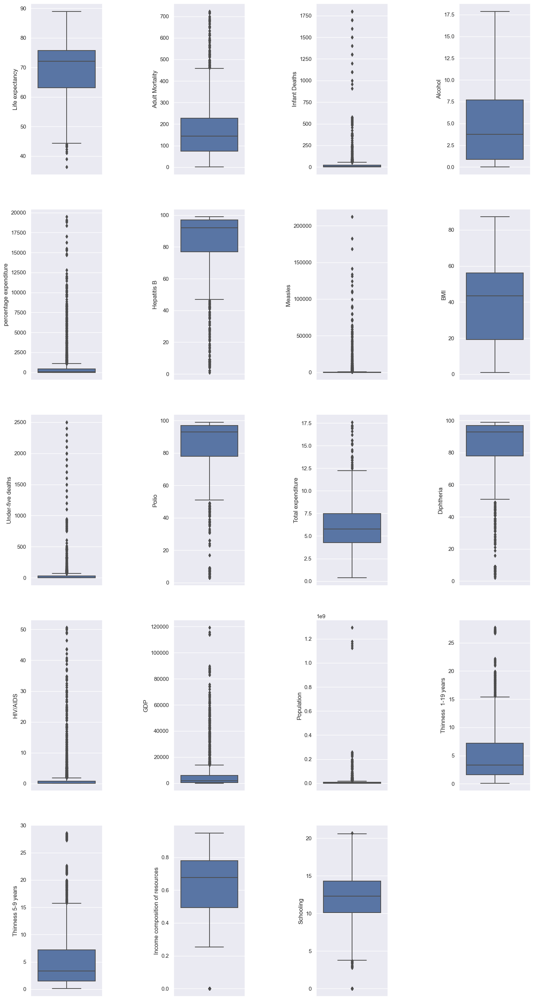

In [13]:
sns.set_theme()
plt.figure(figsize=(18,36))
plt.subplots_adjust(wspace=1, hspace=None)

num_columns = df.drop(columns=["Year","Country","Status"])
i = 1
for col_name in num_columns:
    plt.subplot(5,4,i)
    sns.boxplot(data=df, y=col_name)
    i +=1

Change these would help us to have more accurate Data values
- Adult mortality rates lower than the 5th percentile
- Infant deaths of 0
- BMI less than 10 and greater than 50
- Under Five deaths of 0

![](https://medical.azureedge.net/images/0aa8713b-421f-445f-996a-0aed1695b5a2.jpg)

In [14]:
mort_5_percentile = np.percentile(df["Adult Mortality"].dropna(), 5)
df["Adult Mortality"] = df.apply(lambda x: np.nan if x["Adult Mortality"] < mort_5_percentile else x["Adult Mortality"], axis=1)
df["Infant Deaths"] = df["Infant Deaths"].replace(0, np.nan)
df.BMI = df.apply(lambda x: np.nan if (x.BMI < 10 or x.BMI > 51) else x.BMI, axis=1)
df['Under-five deaths'] = df['Under-five deaths'].replace(0, np.nan)

# Null Values

In [15]:
# Checking for Null Values
df.isnull().sum()

Country                               0
Year                                  0
Status                                0
Life expectancy                      10
Adult Mortality                     155
Infant Deaths                       848
Alcohol                             194
percentage expenditure                0
Hepatitis B                         553
Measles                               0
BMI                                1454
Under-five deaths                   785
Polio                                19
Total expenditure                   226
Diphtheria                           19
HIV/AIDS                              0
GDP                                 448
Population                          652
Thinness  1-19 years                 34
Thinness 5-9 years                   34
Income composition of resources     167
Schooling                           163
dtype: int64

# Replace Null Values with Mean values of its column

In [16]:
imputed_data = []
for year in list(df.Year.unique()):
    year_data = df[df.Year == year].copy()
    for col in list(year_data.columns)[3:]:
        year_data[col] = year_data[col].fillna(year_data[col].dropna().mean()).copy()
    imputed_data.append(year_data)
df2 = pd.concat(imputed_data).copy()

In [17]:
df2.isna().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
Infant Deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
BMI                                0
Under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
HIV/AIDS                           0
GDP                                0
Population                         0
Thinness  1-19 years               0
Thinness 5-9 years                 0
Income composition of resources    0
Schooling                          0
dtype: int64

# Outliers
- Detect the outliers Boxplots/histograms Tukey's Method
- Deal with outliers Drop outliers Limit/Winsorize outliers

In [65]:
# Calculate number of outliers and its percentage in each variable using Tukey's method.

for variable in df2.columns[3:]:
    q75, q25 = np.percentile(df2[variable], [75 ,25])
    iqr = q75 - q25

    min_val = q25 - (iqr*1.5)
    max_val = q75 + (iqr*1.5)
    print("Number of outliers and percentage of it in {} : {} and {}".format(variable,
                                                                             len((np.where((df2[variable] > max_val) | 
                                                                                           (df2[variable] < min_val))[0])),len((np.where((df2[variable] > max_val) | 
                                                                                           (df2[variable] < min_val))[0]))*100/2938))

Number of outliers and percentage of it in Life expectancy : 17 and 0.5786249149081008
Number of outliers and percentage of it in Adult Mortality : 97 and 3.301565690946222
Number of outliers and percentage of it in Infant Deaths : 135 and 4.59496255956433
Number of outliers and percentage of it in Alcohol : 3 and 0.10211027910142954
Number of outliers and percentage of it in percentage expenditure : 389 and 13.240299523485364
Number of outliers and percentage of it in Hepatitis B : 222 and 7.556160653505787
Number of outliers and percentage of it in Measles  : 542 and 18.44792375765827
Number of outliers and percentage of it in BMI : 946 and 32.198774676650785
Number of outliers and percentage of it in Under-five deaths : 142 and 4.833219877467665
Number of outliers and percentage of it in Polio : 279 and 9.496255956432947
Number of outliers and percentage of it in Total expenditure : 51 and 1.7358747447243021
Number of outliers and percentage of it in Diphtheria : 298 and 10.14295439

In [19]:
from scipy.stats.mstats import winsorize

df_final = df2.copy()
df_final["Life expectancy"] = winsorize(df_final['Life expectancy'],(0.01,0),inplace=True)
df_final["Adult Mortality"] = winsorize(df_final["Adult Mortality"],(0,0.05),inplace=True)
df_final["Alcohol"] = winsorize(df_final["Alcohol"],(0,0.01),inplace=True)
df_final["Infant Deaths"] = winsorize(df_final["Infant Deaths"],(0,0.1),inplace=True)
df_final["percentage expenditure"] = winsorize(df_final["percentage expenditure"],(0,0.12),inplace=True)
df_final["Hepatitis B"] = winsorize(df_final["Hepatitis B"],(0.11,0),inplace=True)
df_final["Measles "] = winsorize(df_final["Measles "],(0,0.19),inplace=True)
df_final["Under-five deaths"] = winsorize(df_final["Under-five deaths"],(0,0.12),inplace=True)
df_final["Polio"] = winsorize(df_final["Polio"],(0.1,0),inplace=True)
df_final["Total expenditure"] = winsorize(df_final["Total expenditure"],(0,0.04),inplace=True)
df_final["percentage expenditure"] = winsorize(df_final['percentage expenditure'],(0,0.18),inplace=True)
df_final["BMI"] = winsorize(df_final['BMI'],(0.2,0.2),inplace=True)
df_final["Population"] = winsorize(df_final['Population'],(0,0.14),inplace=True)
df_final["Diphtheria"] = winsorize(df_final['Diphtheria'],(0.15,0),inplace=True)
df_final["Schooling"] = winsorize(df_final['Schooling'],(0.05,0.05),inplace=True)
df_final["HIV/AIDS"] = winsorize(df_final['HIV/AIDS'],(0.0,0.19),inplace=True)
df_final["GDP"] = winsorize(df_final['GDP'],(0,0.13),inplace=True)
df_final["Thinness  1-19 years"] = winsorize(df_final['Thinness  1-19 years'],(0.0,0.04),inplace=True)
df_final["Income composition of resources"] = winsorize(df_final['Income composition of resources'],(0.05,0),inplace=True)
df_final["Thinness 5-9 years"] = winsorize(df_final['Thinness 5-9 years'],(0.0,0.04),inplace=True)

# Check box plots again

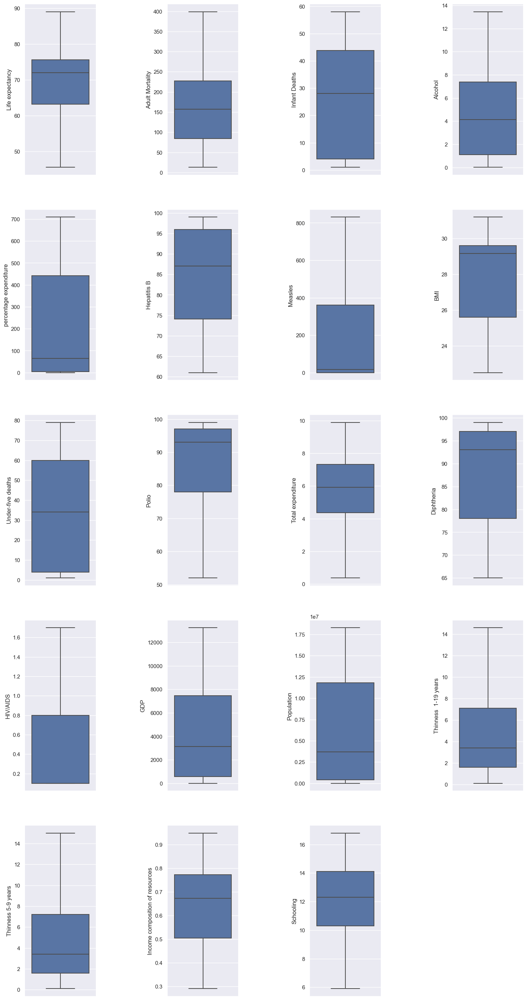

In [20]:
plt.figure(figsize=(18,36))
plt.subplots_adjust(wspace=1, hspace=None)

num_columns = df_final.drop(columns=["Year","Country","Status"])
i = 1
for col_name in num_columns:
    plt.subplot(5,4,i)
    sns.boxplot(data=df_final, y=col_name)
    i +=1

# Correlation

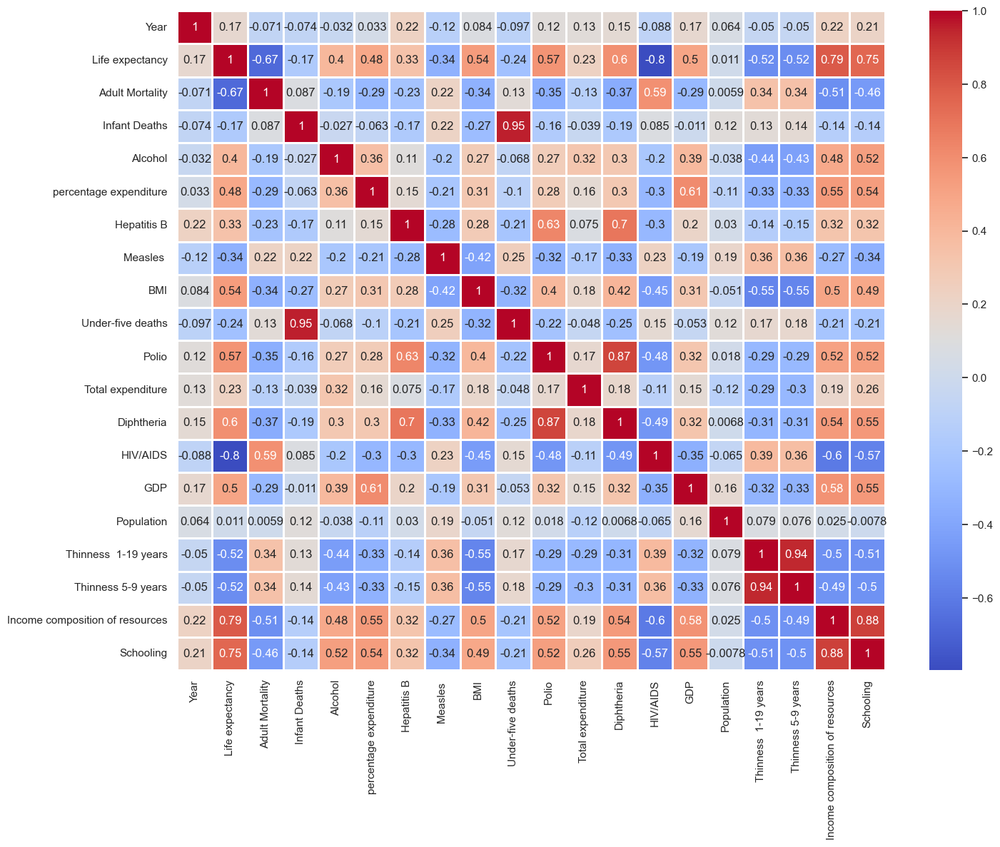

In [21]:
plt.figure(figsize=(16,12))
sns.heatmap(df_final.corr(),annot=True,cmap='coolwarm',linewidths = 2)
plt.show()

# Histogram 

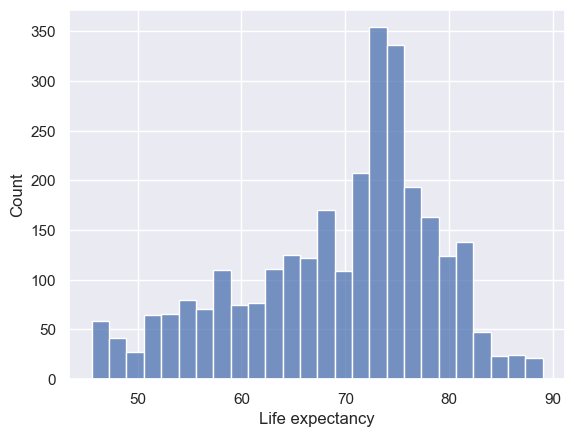

In [22]:
sns.histplot(data = df_final["Life expectancy"]);

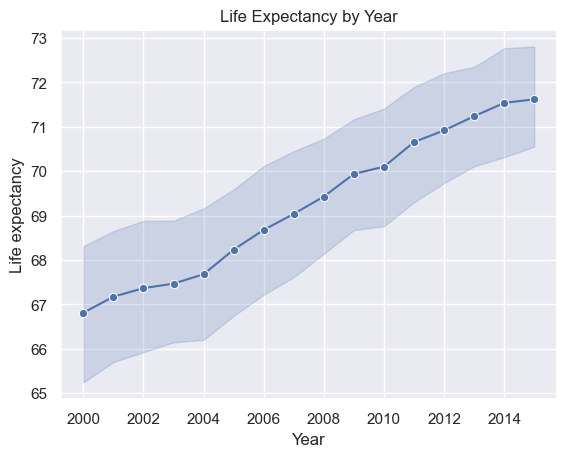

In [23]:
sns.lineplot(data=df_final,x = 'Year', y = 'Life expectancy',  marker='o')
plt.title('Life Expectancy by Year')
plt.show()

In [ ]:
import plotly.express as px

fig=px.line(df_final.sort_values(by='Year'),x='Year',y='Life expectancy',animation_frame='Country',animation_group='Year',color='Country',markers=True,template='plotly',title='<b>Life Expectancy over years',range_y=[0,90])
fig.show()

In [24]:
import plotly.express as px

country_data = px.data.gapminder()
country_data.tail()

,country,continent,year,lifeExp,pop,gdpPercap,iso_alpha,iso_num
1699,Zimbabwe,Africa,1987,62.351,9216418,706.157306,ZWE,716
1700,Zimbabwe,Africa,1992,60.377,10704340,693.420786,ZWE,716
1701,Zimbabwe,Africa,1997,46.809,11404948,792.449960,ZWE,716
1702,Zimbabwe,Africa,2002,39.989,11926563,672.038623,ZWE,716
1703,Zimbabwe,Africa,2007,43.487,12311143,469.709298,ZWE,716


In [25]:
map_fig = px.scatter_geo(country_data,locations = 'iso_alpha', projection = 'orthographic', 
                         opacity = 0.8, color = 'country', hover_name = 'country', 
                         hover_data = ['lifeExp', 'year'],title = '<b>Life Expectancy over the World Map',animation_frame='year',animation_group='country')
map_fig.show()

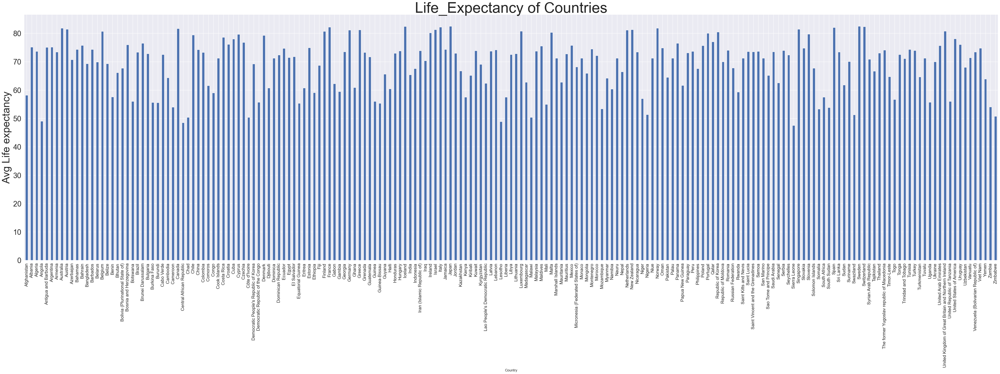

In [26]:
# Life_Expectancy w.r.t Country using bar plot.
Life_Expectancy_country = df_final.groupby('Country')['Life expectancy'].mean()
Life_Expectancy_country.plot(kind='bar', figsize=(59,15), fontsize=25)
plt.title("Life_Expectancy of Countries",fontsize=50)
plt.ylabel("Avg Life expectancy",fontsize=35)
plt.tick_params(axis='x', which='major', labelsize=15)
plt.show()

# Life expectancy Based on Countries status

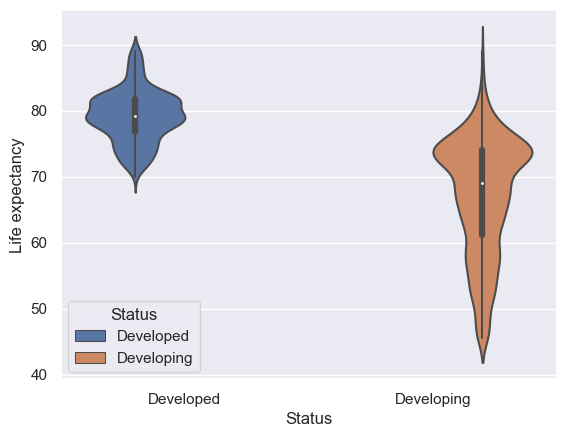

In [27]:
sns.violinplot(data =df_final,x='Status',y='Life expectancy',hue="Status");

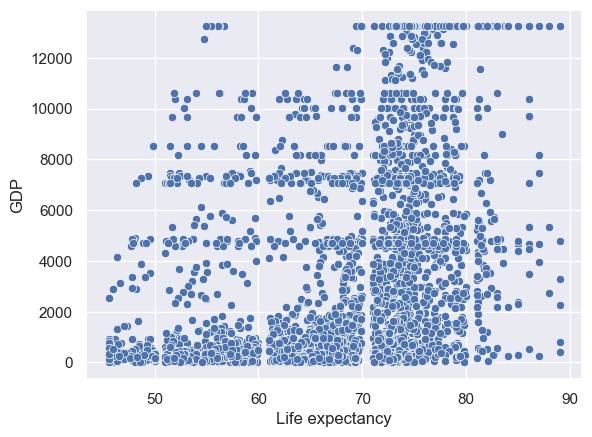

In [28]:
sns.scatterplot(data=df_final,x = "Life expectancy",y = "GDP");

In [30]:
px.scatter_3d(df2.sort_values(by='Year'),y='Adult Mortality',x='Life expectancy',z='Infant Deaths',size='Life expectancy',color='Country')

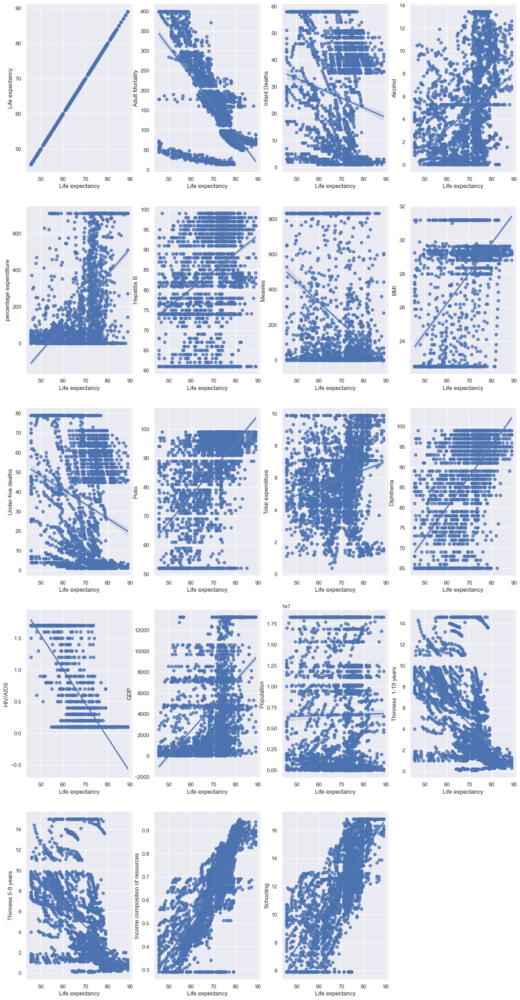

In [62]:
plt.figure(figsize=(18,36))
i = 1
for col_name in num_columns:
    plt.subplot(5,4,i)
    sns.regplot(data=df_final,x = "Life expectancy", y=col_name)
    i +=1

In [56]:
px.scatter(df2,y='Adult Mortality',x='Life expectancy',color='Country',size='Life expectancy', opacity=0.6,title='<b> Life Expectancy VS Adult Mortality')

In [64]:
px.scatter(df2.sort_values(by='Year'),y='Adult Mortality',x='Life expectancy',animation_frame='Year',animation_group='Country',color='Country',size='Life expectancy',opacity=0.6,template='plotly',title='<b> Life Expectancy VS Adult Mortality in every year')

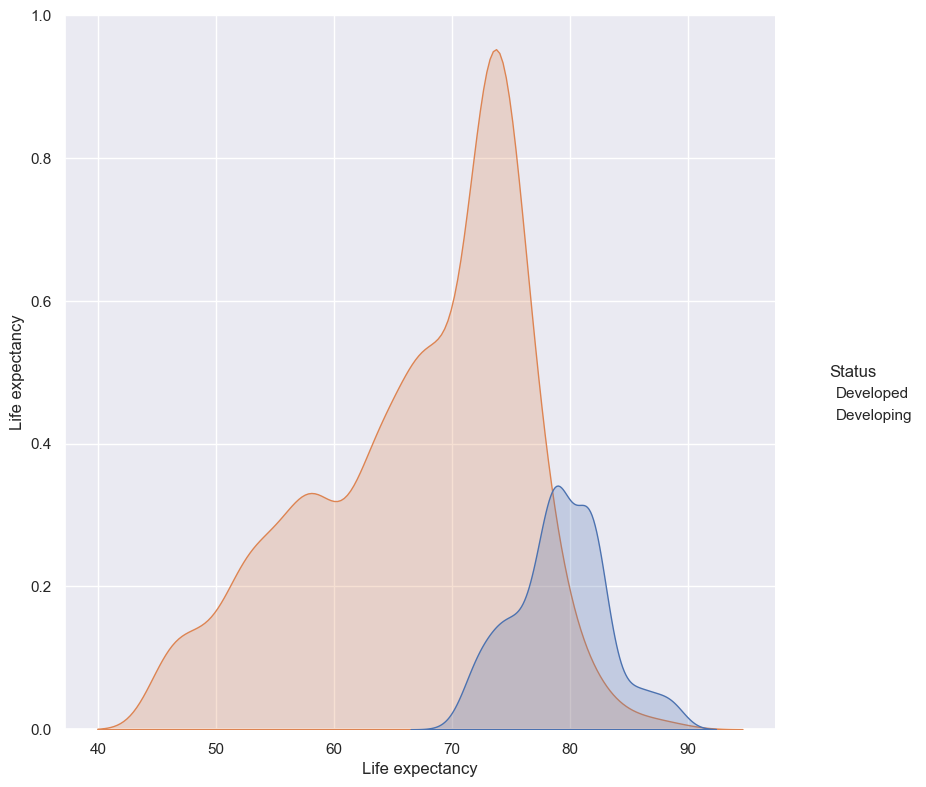

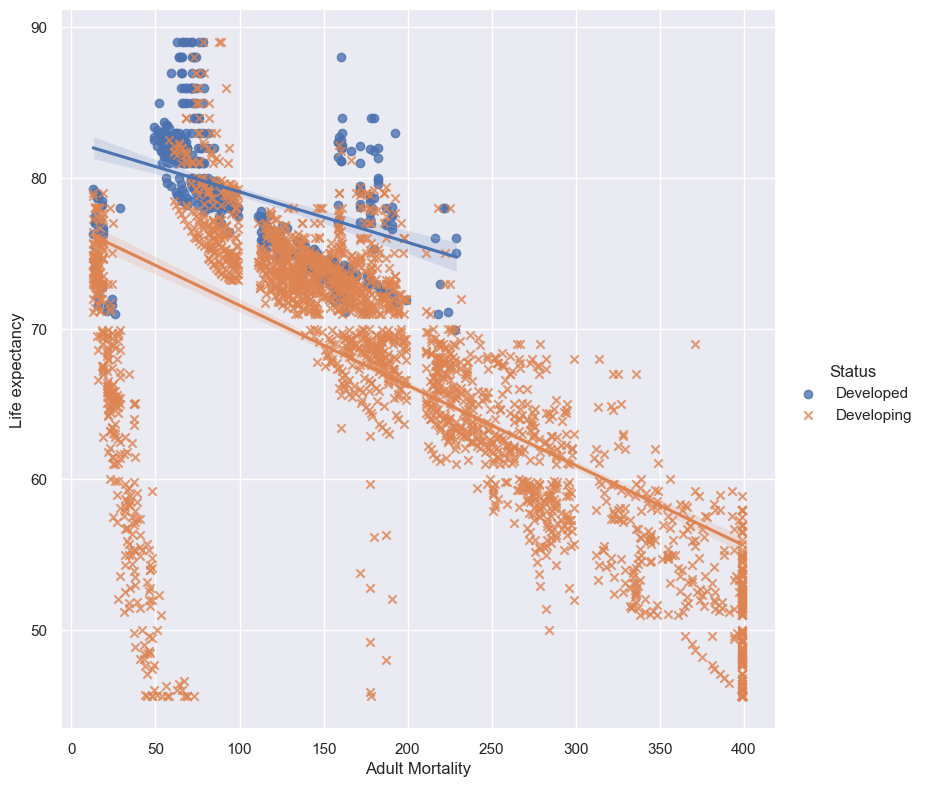

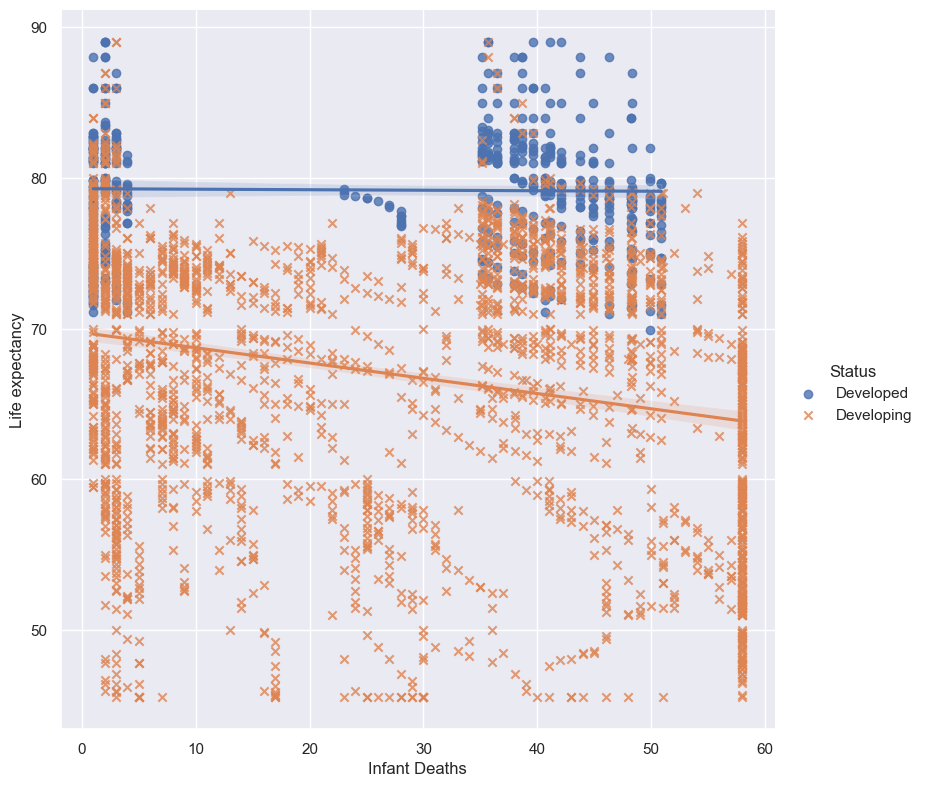

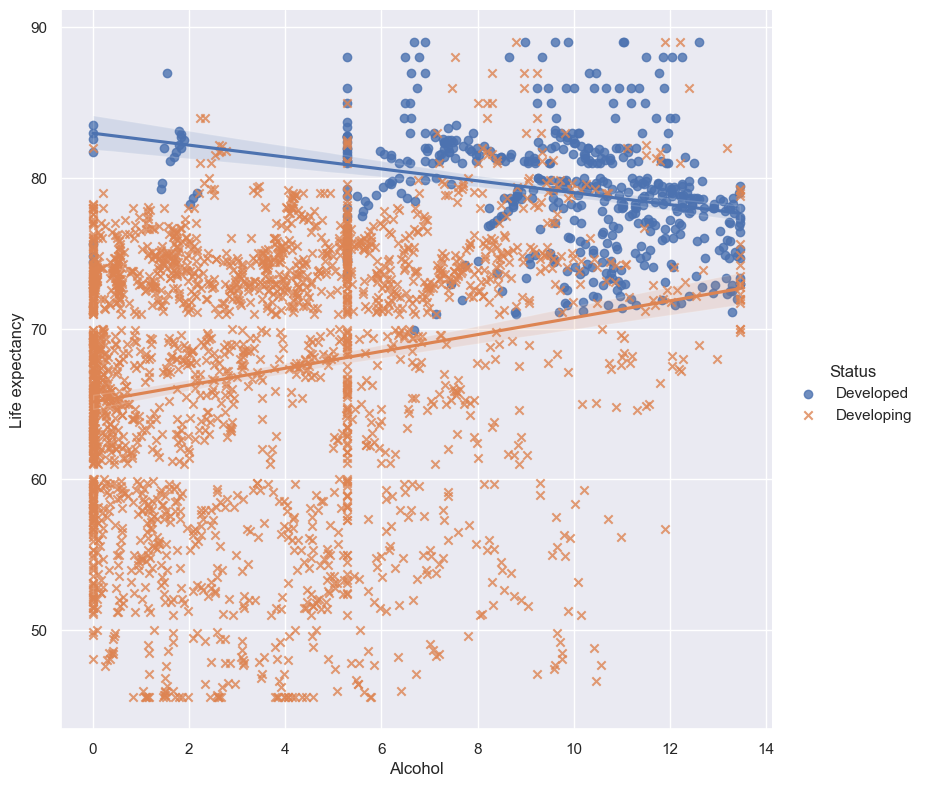

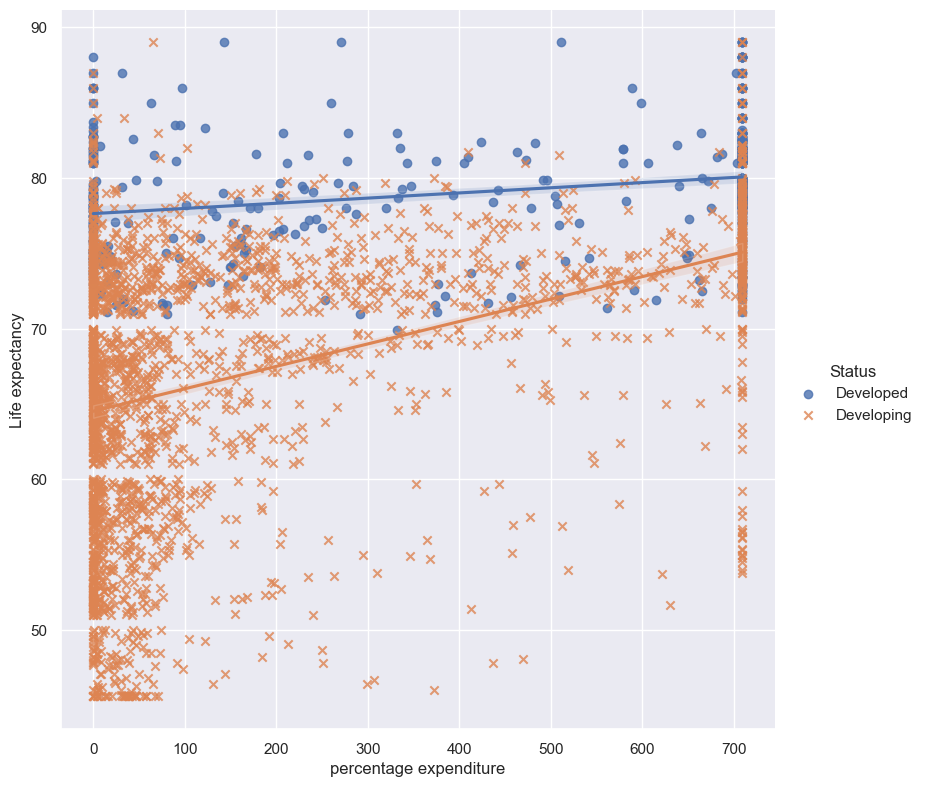

...

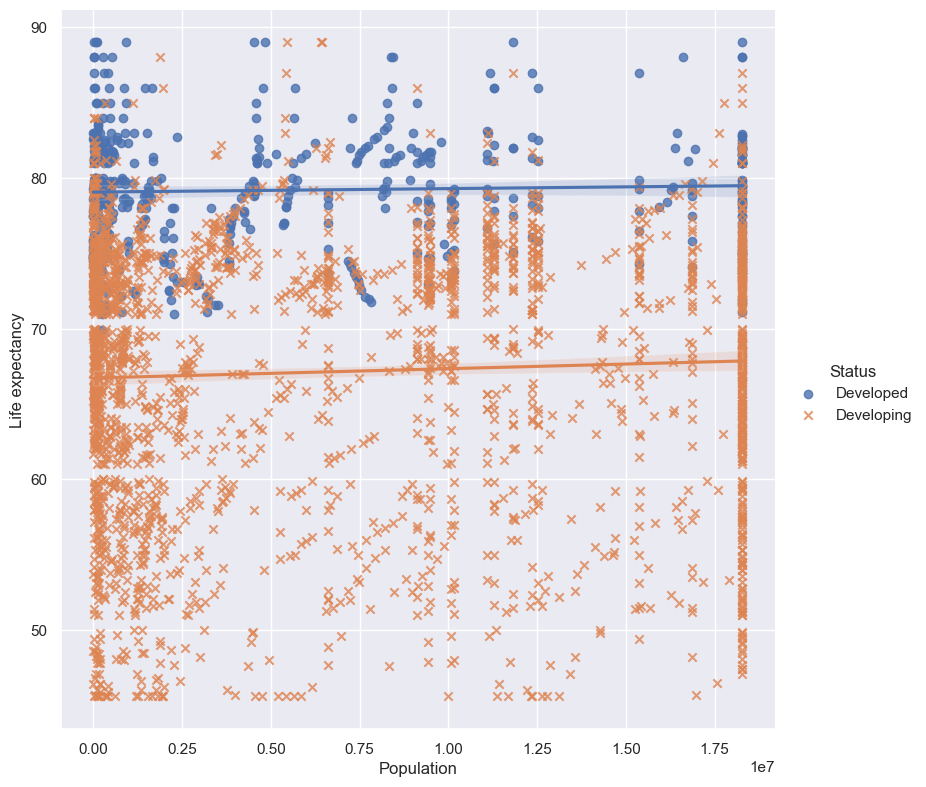

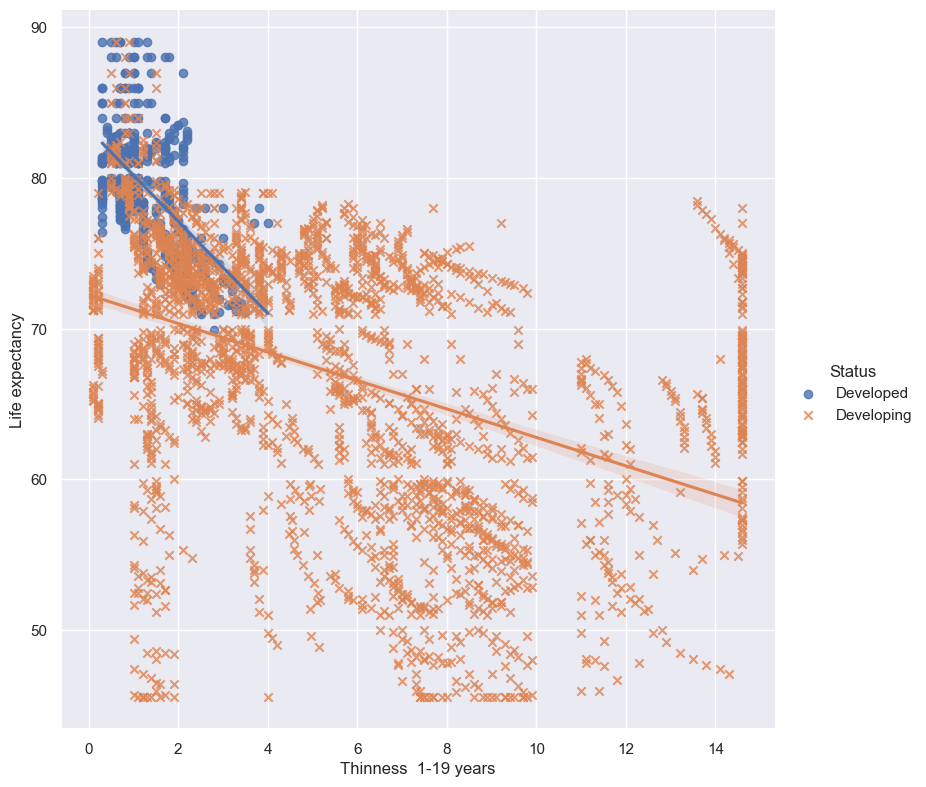

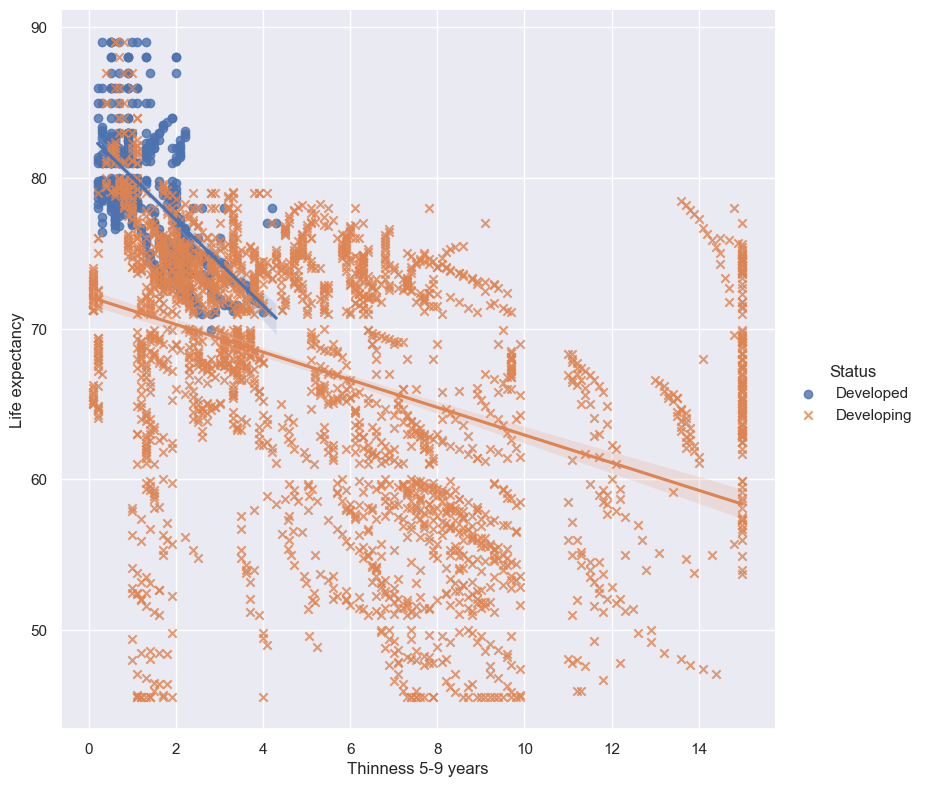

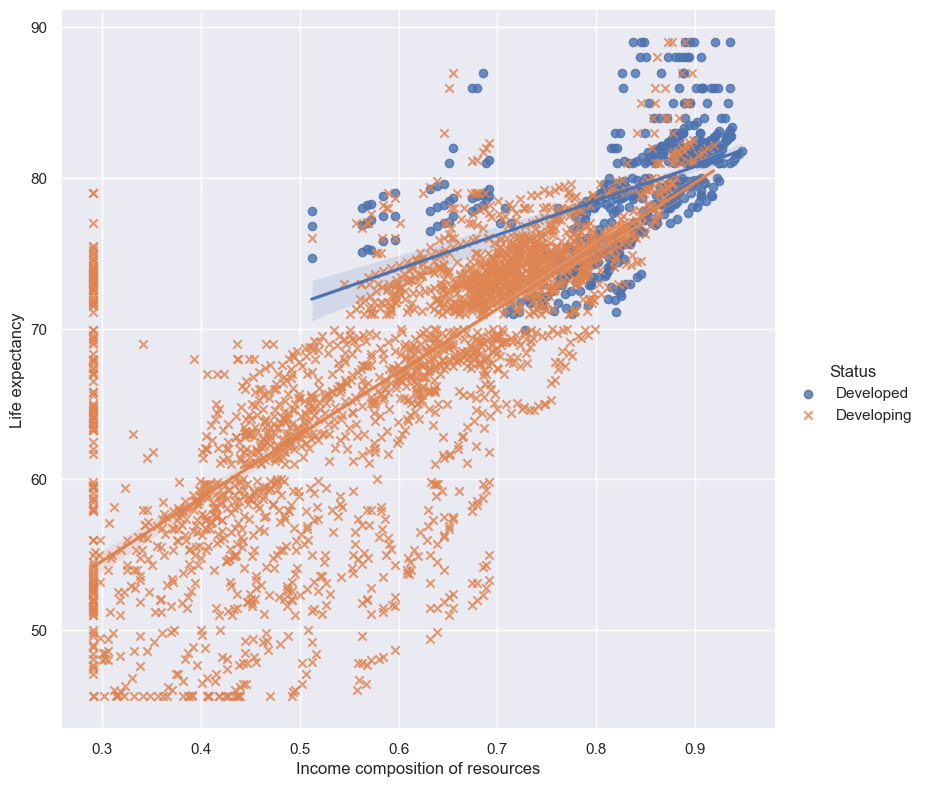

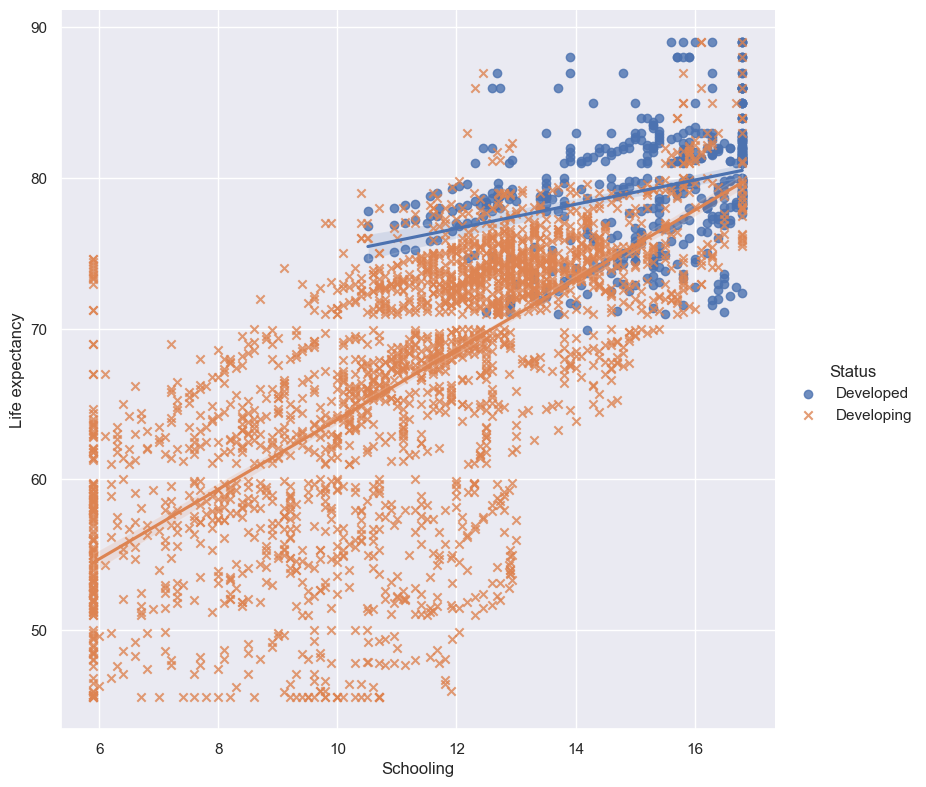

In [32]:
for feature in df_final.columns[3:]:
    sns.pairplot(df_final, x_vars=[feature], y_vars=["Life expectancy"],
             hue="Status",markers=["o", "x"], height=8, kind="reg");

In [33]:
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split

# Linear Regression

In [34]:
linear_reg = LinearRegression()
x = df2.BMI.values.reshape(-1,1)
y = df2["Life expectancy"].values.reshape(-1,1)          

linear_reg.fit(x,y)

LinearRegression()

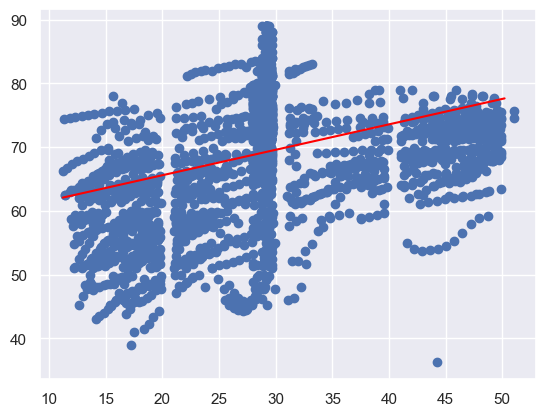

Mean Absolute Error:  39.165288743697765
Mean Squared Error:  1582.0525908092336
Root Mean Squared Error:  39.7750247116106


In [35]:
x_array = np.arange(min(df2.BMI),max(df2.BMI)).reshape(-1,1)  # this for information about the line to be predicted

plt.scatter(x,y)
y_head = linear_reg.predict(x_array)                                 # this is predict life expectancy 
plt.plot(x_array,y_head,color="red")
plt.show()

from sklearn import metrics
print("Mean Absolute Error: ", metrics.mean_absolute_error(x_array,y_head))
print("Mean Squared Error: ", metrics.mean_squared_error(x_array,y_head))
print("Root Mean Squared Error: ", np.sqrt(metrics.mean_squared_error(x_array, y_head)))

# Multi linear regression

In [36]:
Y = df2['Life expectancy']

In [37]:
Country_dummy=pd.get_dummies(df2['Country'])

In [38]:
status_dummy=pd.get_dummies(df2['Status'])

In [39]:
X = df2[4:]

In [40]:
X = pd.concat([df2,Country_dummy,status_dummy],axis=1)
X.drop(["Country","Status","Life expectancy"],inplace=True,axis=1)
X

,Year,Adult Mortality,Infant Deaths,Alcohol,percentage expenditure,Hepatitis B,Measles,BMI,Under-five deaths,Polio,...,Uruguay,Uzbekistan,Vanuatu,Venezuela (Bolivarian Republic of),Viet Nam,Yemen,Zambia,Zimbabwe,Developed,Developing
0,2015,263.0,62.000000,0.010000,71.279624,65.000000,1154,19.100000,83.000000,6.0,...,0,0,0,0,0,0,0,0,0,1
16,2015,74.0,35.129032,4.600000,364.975229,99.000000,0,29.128571,44.844961,99.0,...,0,0,0,0,0,0,0,0,0,1
32,2015,19.0,21.000000,5.288333,0.000000,95.000000,63,29.128571,24.000000,95.0,...,0,0,0,0,0,0,0,0,0,1
48,2015,335.0,66.000000,5.288333,0.000000,64.000000,118,23.300000,98.000000,7.0,...,0,0,0,0,0,0,0,0,0,1
64,2015,13.0,35.129032,5.288333,0.000000,99.000000,0,47.700000,44.844961,86.0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2873,2000,168.0,11.000000,8.010000,0.000000,5.000000,22,28.000926,13.000000,86.0,...,0,0,0,1,0,0,0,0,0,1
2889,2000,139.0,33.000000,1.600000,0.000000,74.035294,16512,28.000926,43.000000,96.0,...,0,0,0,0,1,0,0,0,0,1
2905,2000,252.0,48.000000,0.070000,0.000000,14.000000,0,31.200000,66.000000,74.0,...,0,0,0,0,0,1,0,0,0,1
2921,2000,614.0,44.000000,2.620000,45.616880,74.035294,30930,16.800000,72.000000,85.0,...,0,0,0,0,0,0,1,0,0,1


C:\Users\Lion\AppData\Local\Temp\ipykernel_17660\2516337429.py:1: UserWarning:



`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751




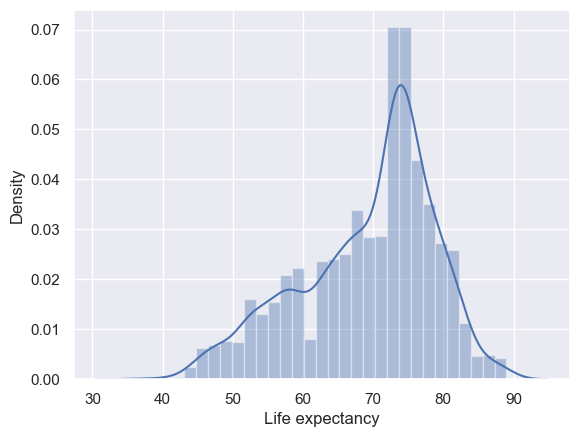

In [41]:
sns.distplot(Y);

In [42]:
df2.isna().sum()

Country                            0
Year                               0
Status                             0
Life expectancy                    0
Adult Mortality                    0
Infant Deaths                      0
Alcohol                            0
percentage expenditure             0
Hepatitis B                        0
Measles                            0
BMI                                0
Under-five deaths                  0
Polio                              0
Total expenditure                  0
Diphtheria                         0
HIV/AIDS                           0
GDP                                0
Population                         0
Thinness  1-19 years               0
Thinness 5-9 years                 0
Income composition of resources    0
Schooling                          0
dtype: int64

In [43]:
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.30, random_state=101)

In [44]:
Linear_model= LinearRegression()

In [45]:
Linear_model.fit(X_train,y_train)

LinearRegression()

In [46]:
pred = Linear_model.predict(X_test)

In [47]:
pred

array([58.17435584, 69.91281114, 56.59602418, 54.94030432, 57.63127902,
       69.94990166, 58.97012628, 58.77195457, 50.8893352 , 75.41418232,
       63.02226813, 54.07382166, 66.18349867, 58.06883058, 70.42032759,
       72.2365163 , 77.1095871 , 53.94967337, 74.40738882, 77.13748601,
       57.40238199, 83.03432506, 68.18022639, 65.02996685, 82.2211359 ,
       48.22585813, 58.29482724, 60.84921744, 66.0448717 , 79.51436518,
       75.27508999, 58.97371182, 61.05397733, 58.76180014, 60.26102116,
       66.8118984 , 70.92458853, 66.55171037, 61.17895506, 53.06476247,
       75.97188621, 69.6810734 , 71.40987196, 76.61362653, 73.40665978,
       73.02407339, 69.27045429, 74.8222464 , 61.60559775, 80.9156569 ,
       73.15634296, 56.47324639, 73.79727793, 82.36498439, 77.13173761,
       59.25921039, 65.73102667, 72.77522403, 55.12269075, 62.84473457,
       72.03147557, 75.71766564, 65.3984955 , 75.06269009, 65.57343096,
       66.19035211, 58.34327395, 73.92979244, 72.74673744, 71.79

In [48]:
from sklearn.metrics import mean_squared_error

print(mean_squared_error(y_test,pred)**(0.5))

2.1285883336693074


In [49]:
from sklearn.metrics import r2_score

r2_score(y_test,pred)

0.9473269595009367